<a href="https://colab.research.google.com/github/bananighosh/Fall-2023-NYU-AI/blob/main/midterm/take_at_home.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem Set 1 (Take Home) - 40 points

## PS 1.A - 20 points

In [this video](https://www.youtube.com/watch?v=ho6JXE3EbZ8) the author explains how to extract various visualizations of what CNNs learn. [Your course site](https://pantelis.github.io/artificial-intelligence/aiml-common/lectures/cnn/cnn-example-architectures/visualizing-what-convnets-learn.html) also covers the topic.

Using the [CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html), train a ResNet-50 based CNN on the classification task of $K=9$ classes (filter out the class `ship`) and create the following visualizations for first, middle and last blocks of ResNet-50. You are free to select a class to showcase such visualizations.

* Visualizing intermediate convnet outputs (“intermediate activations”). This is useful to understand how successive convnet layers transform their input.

* Visualizing convnets filters. This is useful to understand precisely what visual pattern or concept each filter in a convnet is receptive to.

* Visualizing heatmaps of class activation in an image. This is useful to understand which part of an image where identified as belonging to a given class, and thus allows to localize objects in images.


In [ ]:
# Insert your code here
import numpy as np
import tensorflow as tf
from keras.models import Sequential, Model, load_model
from keras.layers import Flatten, Input, Dense, Add, Activation, Dropout, Conv2D, MaxPooling2D,GlobalAveragePooling2D, GlobalMaxPooling2D, AveragePooling2D, Resizing, ZeroPadding2D, BatchNormalization
from keras.optimizers import Adam, SGD
from keras.regularizers import l2
from keras.initializers import glorot_uniform
from keras.preprocessing import image
from keras.utils import to_categorical


from keras.applications import ResNet50
from keras.applications.resnet50 import preprocess_input

from keras import backend as K

from keras.datasets import cifar10

from sklearn.preprocessing import LabelEncoder , OneHotEncoder

from matplotlib.pyplot import imshow


### PS 1.A Data preprocessing

In [ ]:
# Load the CIFAR-10 dataset
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

classes = len(np.unique(y_train))
classes

10

we know the number of classes and index associated from her https://www.tensorflow.org/api_docs/python/tf/keras/datasets/cifar10/load_data

The classes are:
| Label | Description |
|-------|-------------|
| 0     | airplane    |
| 1     | automobile  |
| 2     | bird        |
| 3     | cat         |
| 4     | deer        |
| 5     | dog         |
| 6     | frog        |
| 7     | horse       |
| 8     | ship        |
| 9     | truck       |

We have to exclude the class "ship with index 8"

In [ ]:
# preprocess the CIFAR-10 dataset
index = np.where(y_train == 8)
# Filter the dataset for 9 out of 10 classes (exclude "ship index 8" class)
class_to_exclude = 8  # Adjust this class to exclude "ship"
x_train = x_train[y_train.flatten() != class_to_exclude]
y_train = y_train[y_train != class_to_exclude]
x_test = x_test[y_test.flatten() != class_to_exclude]
y_test = y_test[y_test != class_to_exclude]

# number of classes K=9
k = 9

In [ ]:
print(len(np.unique(y_train)), len(np.unique(x_train)), len(np.unique(y_test)), len(np.unique(x_test)))
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

9 256 9 256
(45000, 32, 32, 3) (45000,) (9000, 32, 32, 3) (9000,)


In [ ]:
# A ResNet-50 model expects 224 × 224–pixel images
im_size = 224

x_train_resize = Resizing(height=im_size, width=im_size, crop_to_aspect_ratio=True)(x_train)
x_test_resize = Resizing(height=im_size, width=im_size, crop_to_aspect_ratio=True)(x_test)

In [ ]:
print(x_train_resize.shape, y_train.shape, x_test_resize.shape, y_test.shape)

(45000, 224, 224, 3) (45000,) (9000, 224, 224, 3) (9000,)


In [ ]:
# for y
y_labelencoder = LabelEncoder ()
y = y_labelencoder.fit_transform (y_train)
#print (y)

ytr=y_train.reshape(-1,1)
onehotencoder = OneHotEncoder()  #Converted  scalar output into vector output where the correct class will be 1 and other will be 0
y_train_norm= onehotencoder.fit_transform(ytr).toarray()

yts=y_test.reshape(-1,1)
# onehotencoder = OneHotEncoder()  #Converted  scalar output into vector output where the correct class will be 1 and other will be 0
y_test_norm= onehotencoder.transform(yts).toarray()

In [ ]:
print(x_train_resize.shape, y_train_norm.shape, x_test_resize.shape, y_test_norm.shape)

(45000, 224, 224, 3) (45000, 9) (9000, 224, 224, 3) (9000, 9)


### PS 1A. Let's build the ResNet50 architecture

#### Identity or Skip path Block

In [ ]:
# x is input, y=F(x)
# identity block simply means input should be equal to output.
#  y = x + F(x)   the layers in a traditional network are learning the true output H(x)
# F(x) = y - x   the layers in a residual network are learning the residual F(x)
# Hence, the name: Residual Block.



def identity_block(X, f, filters, stage, block):
    """

    Arguments:
    X -- input of shape (m, height, width, channel)
    f -- shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    stage -- integer, used to name the layers, depending on their position in the network
    block -- string/character, used to name the layers, depending on their position in the network

    Returns:
    X -- output of the identity block, tensor of shape (n_H, n_W, n_C)
    """

    # defining name basis
    # conv_name_base = 'res' + str(stage) + block + '_branch'
    # bn_name_base = 'bn' + str(stage) + block + '_branch'
    conv_name_base = 'conv' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    # Retrieve Filters
    F1, F2, F3 = filters

    # Saving the input value.we need this later to add to the output.
    X_shortcut = X

    # First component of main path
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a')(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)


    # Second component of main path (≈3 lines)
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b')(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    # Third component of main path (≈2 lines)
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c')(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    # Final step: Add shortcut value to main path, and pass it through a RELU activation
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)


    return X

#### Convolutional BLock

In [ ]:
def convolutional_block(X, f, filters, stage, block, s = 2):

    # defining name basis
    # conv_name_base = 'res' + str(stage) + block + '_branch'
    # bn_name_base = 'bn' + str(stage) + block + '_branch'

    conv_name_base = 'conv' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    # Retrieve Filters
    F1, F2, F3 = filters

    # Save the input value
    X_shortcut = X


    # First layer
    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a')(X) # 1,1 is filter size
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)  # normalization on channels
    X = Activation('relu')(X)


    # Second layer  (f,f)=3*3 filter by default
    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b')(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)


    # Third layer
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c')(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)


    ##### SHORTCUT PATH ####
    X_shortcut = Conv2D(filters = F3, kernel_size = (1, 1), strides = (s,s), padding = 'valid', name = conv_name_base + '1')(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    # Final step: Add shortcut value here, and pass it through a RELU activation
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [ ]:
#Each ResNet block is either 2 layer deep
def ResNet50custom(input_shape=(64, 64, 3), classes=3):
    """
    Implementation of the ResNet50 architecture:
    CONV2D -> BATCHNORM -> RELU -> MAXPOOL -> CONVBLOCK -> IDBLOCK*2 -> CONVBLOCK -> IDBLOCK*3
    -> CONVBLOCK -> IDBLOCK*5 -> CONVBLOCK -> IDBLOCK*2 -> AVGPOOL -> TOPLAYER

    """

    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    # Zero-Padding
    X = ZeroPadding2D((3, 3))(X_input) #3,3 padding

    # Stage 1
    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1')(X) #64 filters of 7*7
    X = BatchNormalization(axis=3, name='bn_conv1')(X) #batchnorm applied on channels
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X) #window size is 3*3

    # Stage 2
    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    # convolutional_block is a function defined above. Convolutional_block have 3 layers.
    #filters=[64, 64, 256] first 64 is for 1st layer and 2nd 64 is for 2nd layer and 256 is for 3rd layer of convultional block
    # below are the conv layers from convolutional_block function
    #X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a')(X)
    #X = Conv2D(F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b')(X)
    #X = Conv2D(F3, (1, 1), strides = (s,s), name = conv_name_base + '2a')(X)

    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    #X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a')(X)
    #X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b')(X)
    #X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c')(X)

    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')
    #X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a')(X)
    #X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b')(X)
    #X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c')(X)


    ### START CODE HERE ###

    # Stage 3
    X = convolutional_block(X, f = 3, filters = [128, 128, 512], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    # Stage 4
    X = convolutional_block(X, f = 3, filters = [256, 256, 1024], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    # Stage 5
    X = convolutional_block(X, f = 3, filters = [512, 512, 2048], stage = 5, block='a', s = 2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    # AVGPOOL
    X = AveragePooling2D((2,2), name="avg_pool")(X)

    ### END CODE HERE ###

    # output layer
    X = Flatten()(X)
    X = Dense(classes, activation='softmax', name='fc' + str(classes), kernel_initializer = glorot_uniform(seed=0))(X)


    # Create model
    model = Model(inputs = X_input, outputs = X, name='ResNet50')

    return model

In [ ]:
model = ResNet50custom(input_shape = (im_size, im_size, 3), classes = k)

In [ ]:
model.summary()

Model: "ResNet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1 (Conv2D)              (None, 112, 112, 64)         9472      ['zero_padding2d[0][0]']      
                                                                                                  
 bn_conv1 (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1[0][0]']        

#### first, middle & last blocks of ResNet50

In [ ]:
layers = model.layers
# for layer in layers:
#     print(layer.name)
# filters, biases = model.layers[2]._get_trainable_state
layers_to_visualize = [model.get_layer('conv1'), model.get_layer('conv2c_branch2b'), model.get_layer('conv5c_branch2c')]
# print(layers[2].name, filters.shape)
for layer in layers_to_visualize:
    print(layer.name)

conv1
conv2c_branch2b
conv5c_branch2c


In [ ]:
# Set hyperparameters
learning_rate = 0.001
beta1 = 0.9
beta2 = 0.999
epsilon = 1e-8
num_iterations = 1000
# optimizer = Adam(learning_rate=learning_rate, beta_1=beta1, beta_2=beta2, epsilon=1e-8)
optimizer = SGD(learning_rate=learning_rate, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Define a custom callback to track validation loss
class ValidationLoss(tf.keras.callbacks.Callback):
    def __init__(self):
        super(ValidationLoss, self).__init__()
        self.validation_losses = []

    def on_epoch_end(self, epoch, logs=None):
        self.validation_losses.append(logs['val_loss'])

# Define the custom learning rate scheduler
class CustomLRScheduler(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        new_lr = 0.0001 / np.sqrt(epoch+1)
        K.set_value(self.model.optimizer.lr, new_lr)
        print(f'Epoch {epoch + 1}: Learning Rate = {new_lr}')

In [ ]:
# x_train_resize.shape, y_train_norm.shape, x_test_resize.shape, y_test_norm.shape
# model.fit(x_train_resize, x_train_resize, epochs = 10, batch_size = 128)
# model.fit(x_train_resize, y_train_norm, epochs=45, batch_size = 128, validation_data=(x_test_resize, x_test_resize), verbose=0)
# Create a custom callback to track validation loss
val_loss_callback = ValidationLoss()
lr_scheduler = CustomLRScheduler()

model.fit(
    x=x_train_resize,  # Your training data
    y=y_train_norm,  # Your training labels
    batch_size=64,
    epochs=10,
    steps_per_epoch=10,
    validation_data=(x_test_resize, y_test_norm),
    callbacks=[val_loss_callback]#, lr_scheduler]
    # Other parameters like callbacks, verbose, etc.
)

Epoch 1/10
10/10 [==============================] - 277s 30s/step - loss: 8.9748 - accuracy: 0.0953 - val_loss: 118.6912 - val_accuracy: 0.1113
Epoch 2/10
10/10 [==============================] - 277s 30s/step - loss: 7.5828 - accuracy: 0.1156 - val_loss: 421.6856 - val_accuracy: 0.1199
Epoch 3/10
10/10 [==============================] - 276s 30s/step - loss: 4.1056 - accuracy: 0.1391 - val_loss: 286.7513 - val_accuracy: 0.1220
Epoch 4/10
10/10 [==============================] - 271s 29s/step - loss: 2.8369 - accuracy: 0.1937 - val_loss: 420.3765 - val_accuracy: 0.1114
Epoch 5/10
10/10 [==============================] - 263s 28s/step - loss: 3.0261 - accuracy: 0.2172 - val_loss: 244.5522 - val_accuracy: 0.1113
Epoch 6/10
10/10 [==============================] - 259s 28s/step - loss: 2.9466 - accuracy: 0.2453 - val_loss: 114.2814 - val_accuracy: 0.1134
Epoch 7/10
10/10 [==============================] - 259s 28s/step - loss: 3.0021 - accuracy: 0.2719 - val_loss: 64.4766 - val_accuracy: 

In [ ]:
model.save('model_my_custom_resnet50_1.h5')

/Users/banani/Library/Python/3.9/lib/python/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### PS1.A - Visualizing intermediate activations
Chose class Dog

In [ ]:
# import tensorflow as tf
model = tf.keras.models.load_model('model_my_custom_resnet50_1.h5')
model.summary()

Model: "ResNet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1 (Conv2D)              (None, 112, 112, 64)         9472      ['zero_padding2d[0][0]']      
                                                                                                  
 bn_conv1 (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1[0][0]']        

In [ ]:
# img_path = 'dogscats/subset/test/cats/cat.1700.jpg'
img_path='refs/dog_1.jpg'
# img_path='refs/dog.215.jpg'

# We preprocess the image into a 4D tensor
from keras.preprocessing import image
import numpy as np

im_size = 224

img = tf.keras.utils.load_img(img_path, target_size=(im_size, im_size))
img_tensor = tf.keras.utils.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 224, 224, 3)


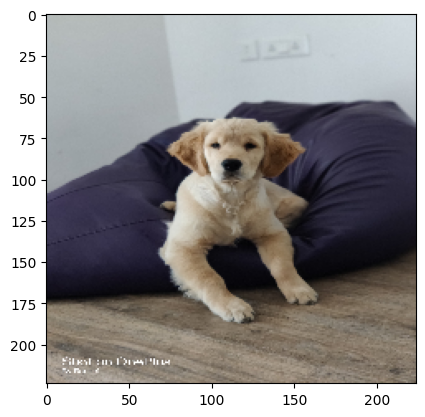

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [ ]:
# layers = model.layers
# # for layer in layers:
# #     print(layer.name)
# # filters, biases = model.layers[2]._get_trainable_state
# layers_to_visualize = [model.get_layer('conv1'), model.get_layer('conv2c_branch2b'), model.get_layer('conv5c_branch2c')]

layers_to_visualize = [model.get_layer('conv1'), model.get_layer('conv3a_branch2b'), model.get_layer('conv5c_branch2c')]
# # print(layers[2].name, filters.shape)
# for layer in model.layers:
#     print(layer.name)
for layer in layers_to_visualize:
    print(layer.name)

conv1
conv3a_branch2b
conv5c_branch2c


In [ ]:
act_input = model.input
# Extracts the outputs of the top 50 layers:
# layer_outputs = [layer.output for layer in model.layers[1:51]]
layer_outputs = [layer.output for layer in layers_to_visualize]

# First block :  conv1
# Middle block:  conv2c_branch2b
# Last block:    conv5c_branch2c

# layer_outputs = [layer.output for layer in layers_to_visualize]
# Creates a model that will return these outputs, given the model input:
activation_model = Model(inputs=act_input, outputs=layer_outputs)


In [ ]:
activation_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1 (Conv2D)              (None, 112, 112, 64)         9472      ['zero_padding2d[0][0]']      
                                                                                                  
 bn_conv1 (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1[0][0]']           

1/1 [==============================] - 0s 49ms/step
(1, 112, 112, 64)
(1, 112, 112, 64)
(1, 28, 28, 128)
(1, 7, 7, 2048)


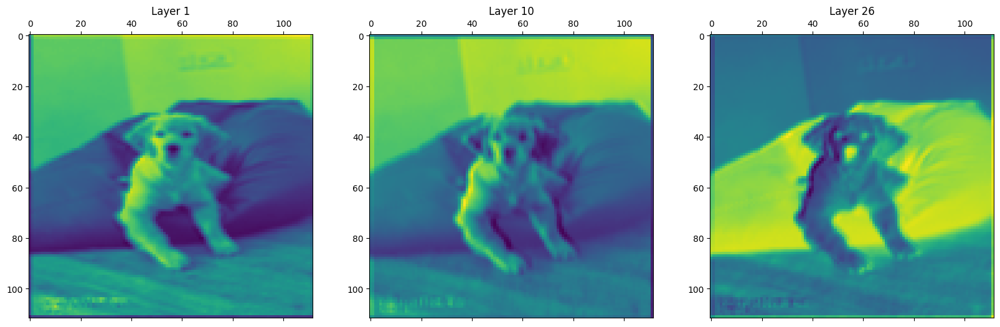

In [ ]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation

activations = activation_model.predict([img_tensor])

first_layer_activation = activations[0]
print(first_layer_activation.shape)

for activation in activations:
    print(activation.shape)

# for i in range(3):  # Loop through the channels
#     plt.matshow(first_layer_activation[0, :, :, i], cmap='viridis')
#     plt.show()
# plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')
# plt.show()
# plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
# plt.show()

fig, axes = plt.subplots(1, 3,  figsize=(20, 8))

# Display the first activation
axes[0].matshow(first_layer_activation[0, :, :, 1], cmap='viridis')
axes[0].set_title('Layer 1')

# Display the second activation
axes[1].matshow(first_layer_activation[0, :, :, 10], cmap='viridis')
axes[1].set_title('Layer 10')

# Display the second activation
axes[2].matshow(first_layer_activation[0, :, :,26], cmap='viridis')
axes[2].set_title('Layer 26')

# Show the subplots
plt.show()




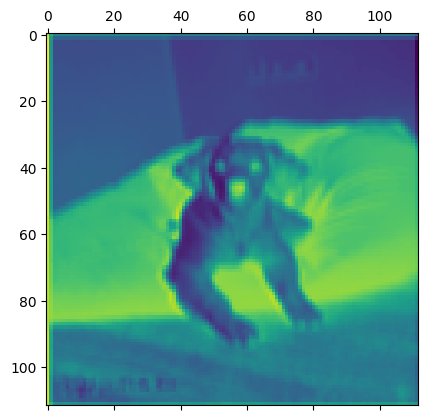

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 53], cmap='viridis')
plt.show()

This one looks like a “bright green dot” detector, useful to encode dog eyes and nose.

At this point, let’s go and plot a complete visualization of all the activations in the network.

(1, 28, 28, 128)


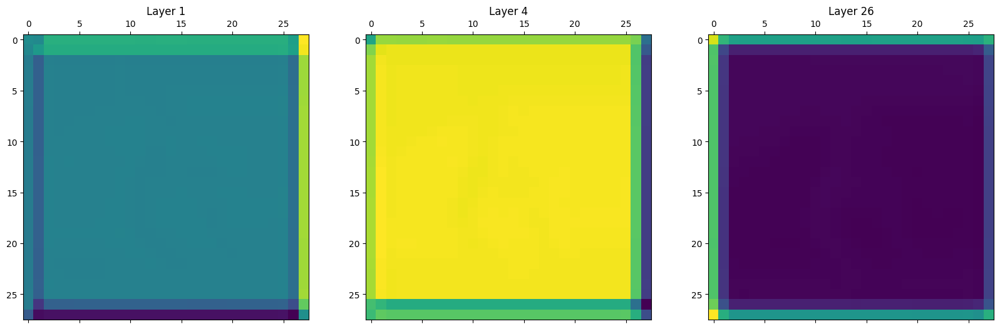

In [ ]:
activations = activation_model.predict([img_tensor])

middle_layer_activation = activations[1]
print(middle_layer_activation.shape)

# for activation in activations:
#     print(activation.shape)

# plt.matshow(middle_layer_activation[0, :, :, 1], cmap='viridis')
# plt.show()

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Display the first activation
axes[0].matshow(middle_layer_activation[0, :, :, 1], cmap='viridis')
axes[0].set_title('Layer 1')

# Display the second activation
axes[1].matshow(middle_layer_activation[0, :, :, 4], cmap='viridis')
axes[1].set_title('Layer 4')

# Display the second activation
axes[2].matshow(middle_layer_activation[0, :, :, 26], cmap='viridis')
axes[2].set_title('Layer 26')

# Show the subplots
plt.show()

(1, 7, 7, 2048)


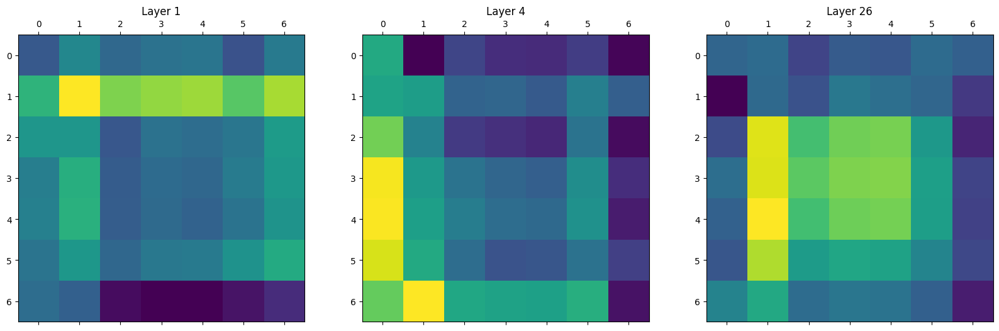

In [ ]:
activations = activation_model.predict([img_tensor])

last_layer_activation = activations[2]
print(last_layer_activation.shape)

# plt.matshow(last_layer_activation[0, :, :, 1], cmap='viridis')
# plt.show()
# plt.matshow(last_layer_activation[0, :, :, 26], cmap='viridis')
# plt.show()

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Display the first activation
axes[0].matshow(last_layer_activation[0, :, :, 1], cmap='viridis')
axes[0].set_title('Layer 1')

# Display the second activation
axes[1].matshow(last_layer_activation[0, :, :, 4], cmap='viridis')
axes[1].set_title('Layer 4')

# Display the second activation
axes[2].matshow(last_layer_activation[0, :, :, 26], cmap='viridis')
axes[2].set_title('Layer 26')

# Show the subplots
plt.show()

conv1
conv4a_branch2b
conv5c_branch2c


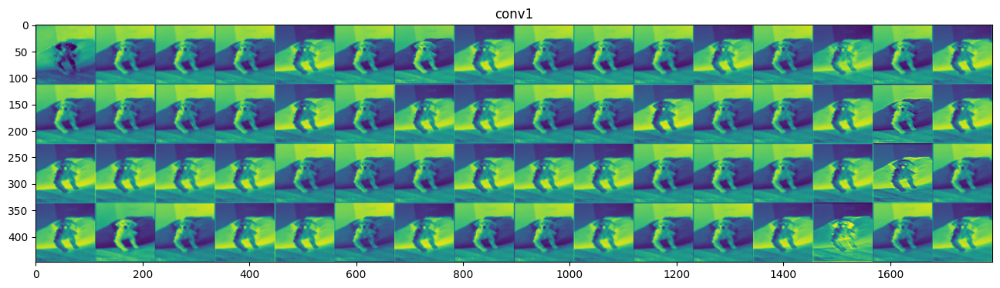

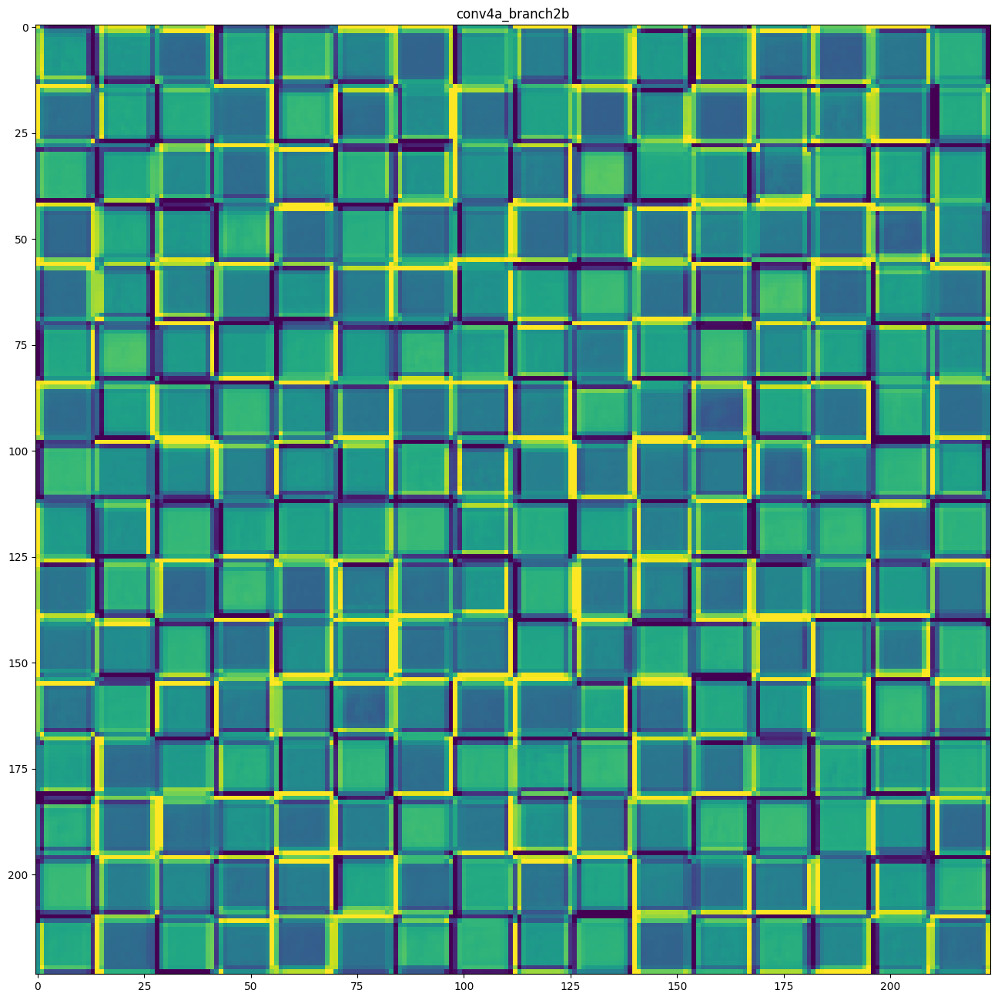

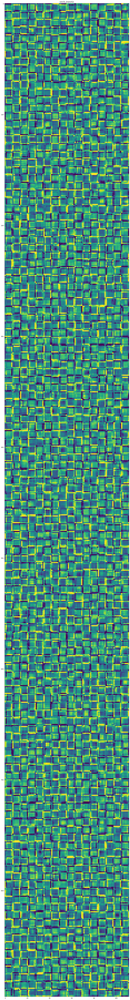

In [ ]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
# layer_names = layers_to_visualize
# for layer in model.layers[:50]:
#     layer_names.append(layer.name)
for layer in layers_to_visualize:
    print(layer.name)
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

### PS1.A - Visualizing convnet filters

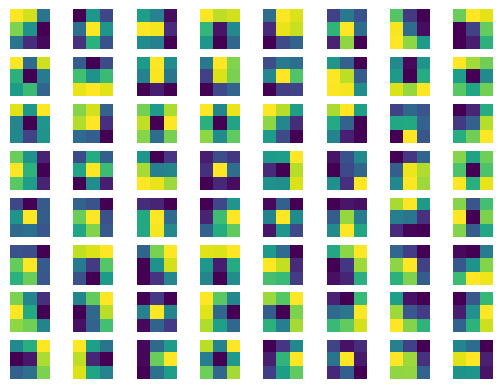

ValueError: num must be an integer with 1 <= num <= 64, not 65

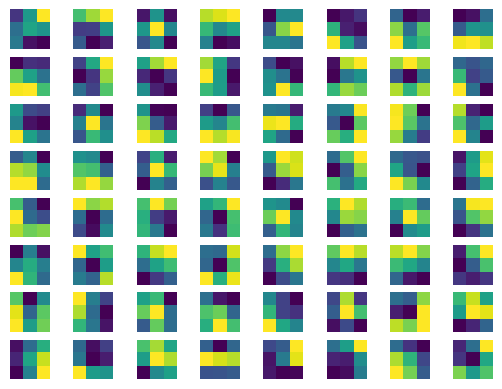

In [ ]:
import matplotlib.pyplot as plt

first_conv_layer = model.get_layer('block1_conv1')  # Assuming the name of the first convolutional layer is 'conv1'

filters, biases = first_conv_layer.get_weights()

for i in range(filters.shape[3]):
    plt.subplot(8, 8, i + 1)
    plt.imshow(filters[:, :, 0, i], cmap='viridis')
    plt.axis('off')

plt.show()

middle_conv_layer = model.get_layer('block3_conv1')
filters, biases = middle_conv_layer.get_weights()

for i in range(filters.shape[3]):
    plt.subplot(8, 8, i + 1)
    plt.imshow(filters[:, :, 0, i], cmap='viridis')
    plt.axis('off')

plt.show()

last_conv_layer = model.get_layer('block5_conv1')
filters, biases = last_conv_layer.get_weights()

for i in range(filters.shape[3]):
    plt.subplot(8, 8, i + 1)
    plt.imshow(filters[:, :, 0, i], cmap='viridis')
    plt.axis('off')

plt.show()


In [ ]:
tf.compat.v1.disable_eager_execution()

# model = tf.keras.applications.vgg16.VGG16(weights='imagenet', include_top=False)

# layer_name = 'block3_conv1'
layer_name = 'conv3a_branch2c'
filter_index = 0

In [ ]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element -- which is a tensor.

layer_output = model.get_layer(layer_name).output
loss = tf.keras.backend.mean(layer_output[:, :, :, filter_index])

grads = K.gradients(loss, model.input)[0]
layer_output

<tf.Tensor 'conv3a_branch2c/BiasAdd:0' shape=(None, 28, 28, 512) dtype=float32>

In [ ]:
# We add 1e-5 before dividing so as to avoid accidentally dividing by 0.
grads /= (tf.keras.backend.sqrt(tf.keras.backend.mean(tf.keras.backend.square(grads))) + 1e-5)

In [ ]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 224, 224, 3))])

In [ ]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [ ]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [ ]:
def generate_pattern(layer_name, filter_index, size=224):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])

    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    return deprocess_image(img)

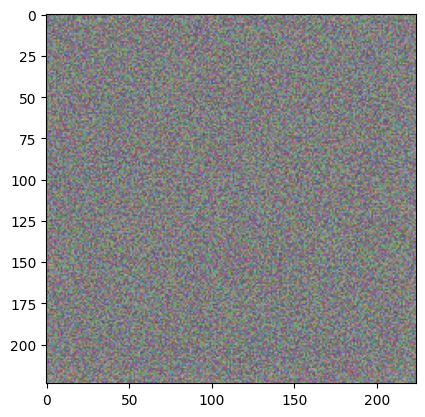

In [ ]:
# plt.imshow(generate_pattern('block3_conv1', 0))
plt.imshow(generate_pattern(layer_name, filter_index))
plt.show()

In [ ]:
# layers_to_visualize = [model.get_layer('conv1'), model.get_layer('conv2c_branch2b'), model.get_layer('conv5c_branch2c')]
# layers_to_visualize
model.summary()

Model: "ResNet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1 (Conv2D)              (None, 112, 112, 64)         9472      ['zero_padding2d[0][0]']      
                                                                                                  
 bn_conv1 (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1[0][0]']        

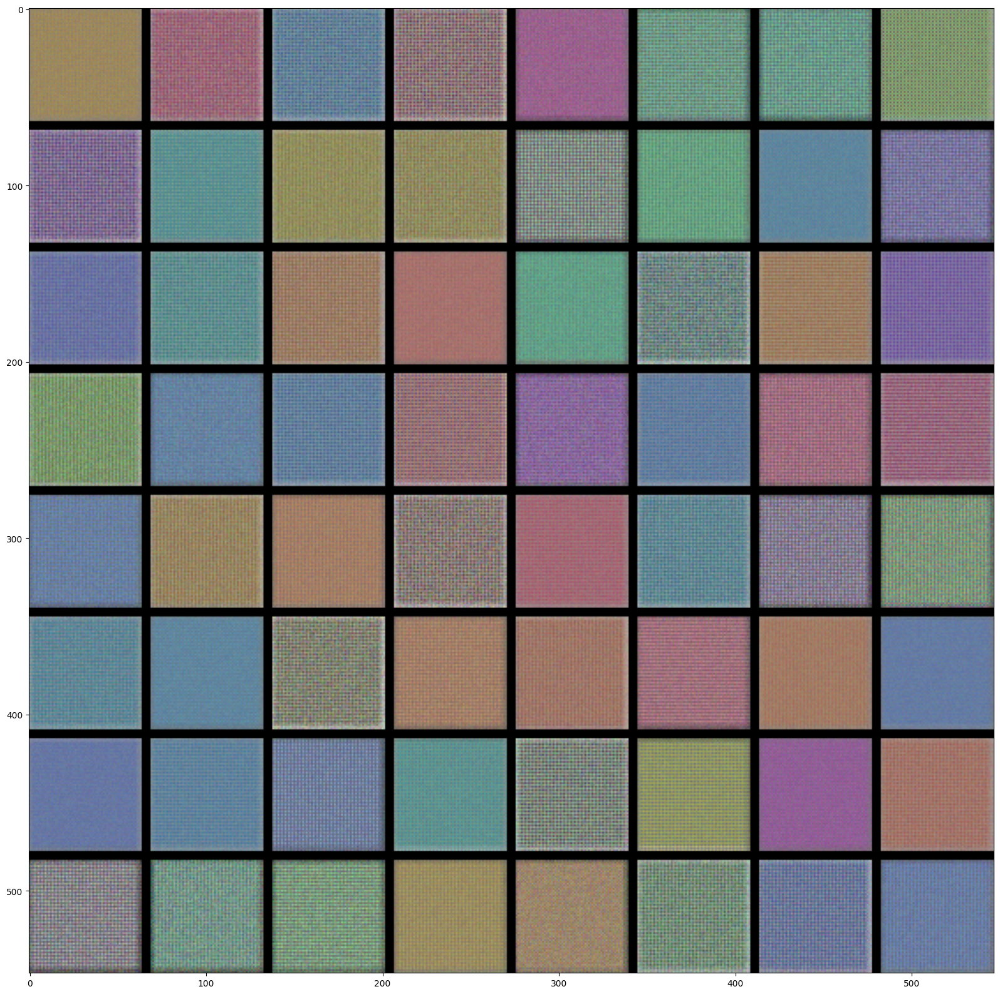

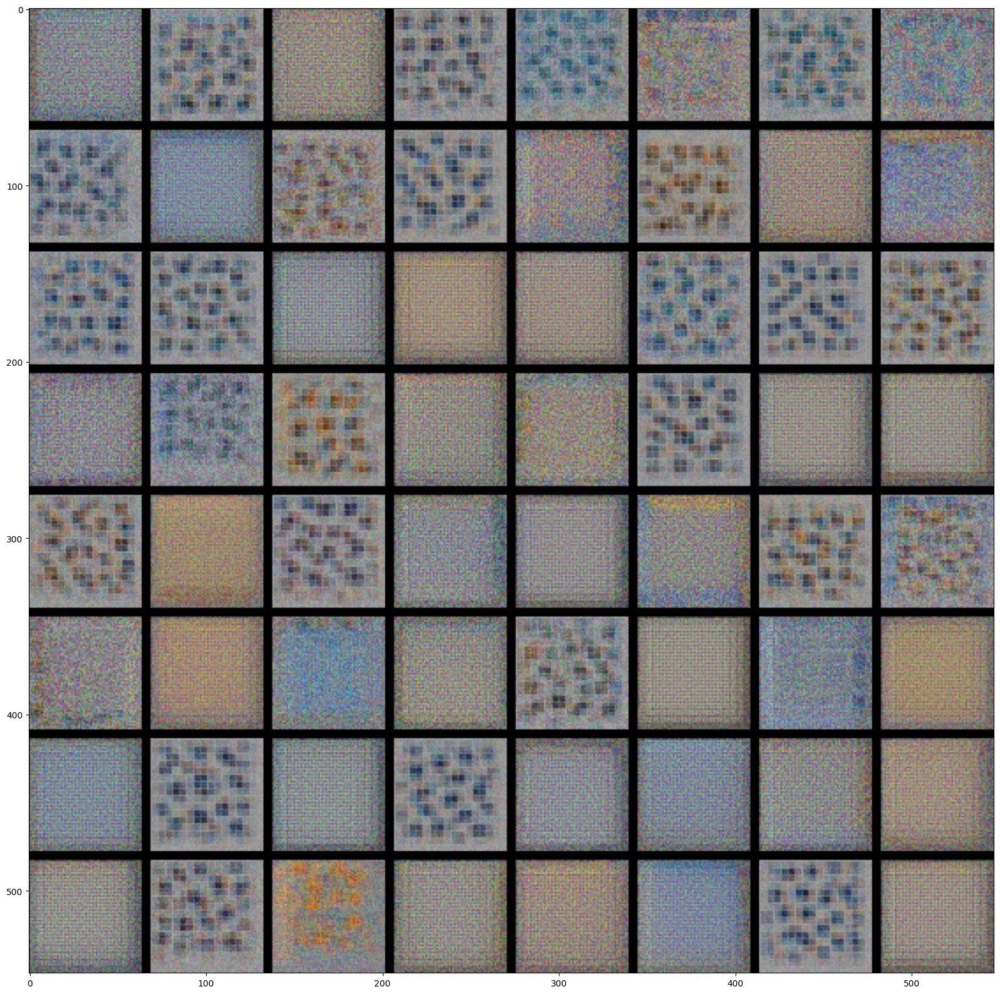

: 

In [ ]:
# for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
# for layer_name in ['block1_conv1', 'block3_conv1', 'block4_conv1']:
layer_names = []
for layer in layers_to_visualize:
    layer_names.append(layer.name)
for layer_name in layer_names:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow((results * 255).astype(np.uint8))
    plt.show()

### PS1A. Visualizing heatmaps of class activation

In [ ]:
def generate_grad_cam(model, activation_layer, img_tensor, class_index):
    # Define the gradient tape
    with tf.GradientTape() as tape:
        # Watch the input tensor
        tape.watch(img_tensor)

        # Get the output of the final convolutional layer
        last_conv_output = model.layers[activation_layer].output

        # Get the model's prediction for the given image
        prediction = model(img_tensor)

        # Extract the score for the target class
        target_class_score = prediction[:, class_index]

    # Calculate the gradients of the target class score with respect to the last_conv_output
    grads = tape.gradient(target_class_score, last_conv_output)

    # Compute the per-channel mean of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel in the feature map by "how important this channel is" with regard to the target class
    last_conv_output = last_conv_output[0]
    heatmap = last_conv_output @ pooled_grads

    return heatmap

In [ ]:
import cv2

def overlay_heatmap(heatmap, img_path, alpha=0.4):
    img = cv2.imread(img_path)

    # Resize the heatmap to the size of the original image
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Normalize the heatmap
    heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap))

    # Apply a colormap to the heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)

    # Superimpose the heatmap on the original image
    superimposed_img = heatmap * alpha + img

    plt.imshow(cv2.cvtColor(np.uint8(superimposed_img), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


In [ ]:
# img_path = 'path/to/your/image.jpg'
# img = tf.keras.utils.load_img(img_path, target_size=(224, 224))

# # Preprocess the image to match the model's input requirements
# img_array = tf.keras.utils.img_to_array(img)
# img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
# img_tensor = np.expand_dims(img_array, axis=0)

class_index = 5  # Replace with the index of the class you want to visualize

for activation_layer in activations:
    heatmap = generate_grad_cam(model, activation_layer, img_tensor, class_index)
    overlay_heatmap(heatmap, img_path)

## PS 1.B - 20 points

In [this notebook](https://pantelis.github.io/artificial-intelligence/aiml-common/lectures/transfer-learning/transfer_learning_tutorial.html) we showcase _transfer learning_ using a pre-trained CNN model.

Perform the fine-tunning and feature extraction methods of transfer learning using the same model as in PS-1A, for the class `ship`.

Repeat the visualization of PS-1.A before and after  transfer learning and write a conclusive summary as to the relative value of the two methods.

### PS2.B Load the pretrained custom ResNet50 model

In [ ]:
# Insert your code here

#Load base_model from PS 1.A
base_model = load_model('model_my_custom_resnet50_1.h5')

### Update model to binary classification

In [ ]:
model_2b = Sequential()
model_2b.add(base_model)
model_2b.add(Flatten())
model_2b.add(Dense(256, activation='relu'))
model_2b.add(Dropout(0.5))
model_2b.add(Dense(1, activation='sigmoid'))  # For binary classification ('ship' or 'not ship')

model_2b.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ResNet50 (Functional)       (None, 9)                 23753609  
                                                                 
 flatten_6 (Flatten)         (None, 9)                 0         
                                                                 
 dense_10 (Dense)            (None, 256)               2560      
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                 257       
                                                                 
Total params: 23756426 (90.62 MB)
Trainable params: 23703306 (90.42 MB)
Non-trainable params: 53120 (207.50 KB)
_________________________________________________________________


In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
# Create the final model
transfer_model = Model(inputs=model_2b.input, outputs=model_2b.outputs)

# Compile the model with an appropriate optimizer and loss function
# transfer_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

transfer_model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

transfer_model.summary()


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ResNet50_input (InputLayer  [(None, 224, 224, 3)]     0         
 )                                                               
                                                                 
 ResNet50 (Functional)       (None, 9)                 23753609  
                                                                 
 flatten_6 (Flatten)         (None, 9)                 0         
                                                                 
 dense_10 (Dense)            (None, 256)               2560      
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                 257       
                                                           

### PS2.B Visualize Activation

In [ ]:
activations = activation_model.predict([img_tensor])

middle_layer_activation = activations[1]
print(middle_layer_activation.shape)

### PS2.B Visulaize convnet Filter

### PS2.B Visualize Heatmaps